# GPT-Image-2 on Microsoft Foundry - Part 5: Advanced image generation

> Reference: https://techcommunity.microsoft.com/blog/azure-ai-foundry-blog/introducing-openais-gpt-image-2-in-microsoft-foundry/4500571

Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

In [1]:
import base64
import c2pa
import datetime
import io
import json
import math
import random
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import os
import requests
import sys
import time

from azure.identity import DefaultAzureCredential, get_bearer_token_provider
from contextlib import contextmanager
from dotenv import load_dotenv
from IPython.display import display, Image as IPyImage
from openai import AzureOpenAI
from pathlib import Path
from PIL import Image

In [2]:
print(f"Python {sys.version}")
print(f"Today is {datetime.datetime.today():%d-%b-%Y %H:%M:%S}")

Python 3.10.19 (main, Oct 21 2025, 16:43:05) [GCC 11.2.0]
Today is 26-May-2026 16:02:58


## Configuration

In [3]:
load_dotenv("azure.env", override=True)

endpoint: str = os.environ["ENDPOINT"]
api_version: str = os.getenv("AZURE_OPENAI_API_VERSION", "2025-04-01-preview")
deployment_name: str = os.getenv("AZURE_OPENAI_DEPLOYMENT_NAME", "gpt-image-2")

EDITS_URL: str = (
    f"{endpoint.rstrip('/')}/openai/deployments/"
    f"{deployment_name}/images/edits?api-version={api_version}"
)

INPUT_DIR = Path("input")
INPUT_DIR.mkdir(parents=True, exist_ok=True)   # FIX: was missing

OUTPUT_DIR = Path("output")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"Deployment : {deployment_name}")
print(f"API version: {api_version}")
print()
print(f"Input dir  : {INPUT_DIR.resolve()}")
print(f"Output dir : {OUTPUT_DIR.resolve()}")

Deployment : gpt-image-2
API version: 2025-04-01-preview

Input dir  : /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/input
Output dir : /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/output


## Authentication (Entra ID - keyless)

In [4]:
COGNITIVE_SCOPE = "https://cognitiveservices.azure.com/.default"

_credential = DefaultAzureCredential()


def get_auth_headers() -> dict[str, str]:
    """Return a fresh Bearer-token Authorization header.

    DefaultAzureCredential.get_token() handles caching and renewal
    internally, so this is safe to call before every API request.

    Returns:
        Dict with a single ``Authorization`` key.
    """
    token = _credential.get_token(COGNITIVE_SCOPE)
    return {"Authorization": f"Bearer {token.token}"}


try:
    tok = _credential.get_token(COGNITIVE_SCOPE)
    print(
        f"Token acquired. Expires: {datetime.datetime.fromtimestamp(tok.expires_on)}"
    )
except Exception as exc:
    print(f"Auth failed: {exc}\nRun 'az login' or check your managed identity.")


Token acquired. Expires: 2026-05-26 16:23:54


## Helpers

In [5]:
MAX_IMAGE_BYTES: int = 50 * 1024 * 1024   # 50 MB per API limit
MAX_IMAGE_COUNT: int = 16                  # API supports up to 16 images
VALID_SIZES: frozenset[str] = frozenset({"1024x1024", "1024x1536", "1536x1024"})
VALID_QUALITIES: frozenset[str] = frozenset({"low", "medium", "high"})
VALID_FORMATS: frozenset[str] = frozenset({"png", "jpeg", "webp"})
RETRYABLE_STATUS: frozenset[int] = frozenset({429, 500, 502, 503, 504})


@contextmanager
def timer(label: str = ""):
    """Context manager that prints elapsed wall-clock time.

    Args:
        label: Optional description printed before the elapsed time.
    """
    start = time.monotonic()
    yield
    elapsed = time.monotonic() - start
    minutes, seconds = divmod(elapsed, 60)
    tag = f"{label}: " if label else ""
    print(f"⏱️ {tag} Done in {int(minutes)} minutes and {seconds:.0f} seconds.")


def save_image(b64_data: str, stem: str) -> Path:
    """Decode a base64 PNG string and save it with a timestamp suffix.

    Args:
        b64_data: Base64-encoded image string returned by the API.
        stem: Filename stem (without extension or timestamp).

    Returns:
        Path to the saved file.
    """
    ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    path = OUTPUT_DIR / f"{stem}_{ts}.png"
    path.write_bytes(base64.b64decode(b64_data))
    print(f"💾 Saved: '{path}'")
    return path


def validate_images(image_paths: list[str | Path]) -> None:
    """Validate image files before sending to the API.

    Checks existence, file size (< 50 MB), and MIME type (PNG / JPEG).
    Raises ValueError or FileNotFoundError on the first failing image.

    Args:
        image_paths: Local image paths to validate.

    Raises:
        FileNotFoundError: If a file does not exist.
        ValueError: If a file exceeds the size limit or has an unsupported format.
    """
    for raw in image_paths:
        p = Path(raw)
        if not p.exists():
            raise FileNotFoundError(f"Image not found: '{p}'")
        size_bytes = p.stat().st_size
        if size_bytes > MAX_IMAGE_BYTES:
            mb = size_bytes / (1024 ** 2)
            raise ValueError(
                f"'{p.name}' is {mb:.1f} MB - API limit is 50 MB."
            )
        if p.suffix.lower() not in {".png", ".jpg", ".jpeg"}:
            raise ValueError(
                f"'{p.name}' has unsupported format '{p.suffix}'. "
                "Use PNG or JPEG."
            )


def display_image(image_path: str | Path, max_size: int = 512) -> None:
    """Display an image file inline at a controlled size.

    Args:
        image_path: Path to the image file.
        max_size: Maximum width or height in pixels. Defaults to 512.

    Raises:
        FileNotFoundError: If the image file does not exist.
    """
    p = Path(image_path)
    if not p.exists():
        raise FileNotFoundError(f"Image not found: '{p}'")
    img = Image.open(p)
    img.thumbnail((max_size, max_size))
    display(img)

In [6]:
def edit_images(
    image_paths: list[str | Path],
    prompt: str,
    mask_path: str | Path | None = None,
    size: str = "1024x1024",
    quality: str = "high",
    output_format: str = "png",   # NEW: exposed as parameter
    n: int = 1,
    stem: str = "compose",        # NEW: configurable file stem
    max_retries: int = 5,
    backoff_base: float = 2.0,
) -> list[Path]:
    """Call the Azure OpenAI gpt-image-2 edits endpoint with multiple input images.

    Uses Entra ID (DefaultAzureCredential) - no API key required.
    Images are sent via the ``image[]`` multipart field; order matters.
    If a mask is supplied it always applies to ``image[0]``.

    Automatically retries on 429 (rate-limit) and 5xx (transient server)
    errors using exponential backoff with jitter. The ``Retry-After``
    header is respected when present.

    Args:
        image_paths: Local image paths (PNG or JPEG, < 50 MB each, max 16).
        prompt: Text instruction describing the desired edit or composition.
        mask_path: Optional RGBA PNG mask; transparent pixels mark the edit region.
        size: Output resolution - ``1024x1024``, ``1024x1536``, or ``1536x1024``.
        quality: ``low``, ``medium``, or ``high``.
        output_format: ``png``, ``jpeg``, or ``webp``.
        n: Number of output images to generate (1-10).
        stem: Filename stem prefix for saved output images.
        max_retries: Maximum number of retry attempts before raising.
        backoff_base: Base (seconds) for exponential back-off: wait = base^attempt + jitter.

    Returns:
        List of Paths to the saved output images.

    Raises:
        FileNotFoundError: If any input file does not exist.
        ValueError: If parameters are invalid.
        requests.HTTPError: If all retries are exhausted.
    """

    if not image_paths:
        raise ValueError("At least one image path is required.")
    if len(image_paths) > MAX_IMAGE_COUNT:
        raise ValueError(
            f"API supports up to {MAX_IMAGE_COUNT} images; got {len(image_paths)}."
        )
    if size not in VALID_SIZES:
        raise ValueError(f"Invalid size '{size}'. Choose from {VALID_SIZES}.")
    if quality not in VALID_QUALITIES:
        raise ValueError(f"Invalid quality '{quality}'. Choose from {VALID_QUALITIES}.")
    if output_format not in VALID_FORMATS:
        raise ValueError(f"Invalid output_format '{output_format}'. Choose from {VALID_FORMATS}.")

    validate_images(image_paths)   # FIX: check existence and size before opening

    def _build_payload() -> tuple[list[tuple], list[io.BufferedReader]]:
        """Open image files and build the multipart files list.

        Returns:
            Tuple of (files list for requests, open file handles to close later).
        """
        files: list[tuple] = []
        handles: list[io.BufferedReader] = []
        for path in image_paths:
            p = Path(path)
            mime = "image/png" if p.suffix.lower() == ".png" else "image/jpeg"
            fh = open(p, "rb")
            handles.append(fh)
            files.append(("image[]", (p.name, fh, mime)))

        if mask_path is not None:
            mp = Path(mask_path)
            fh_mask = open(mp, "rb")
            handles.append(fh_mask)
            files.append(("mask", (mp.name, fh_mask, "image/png")))
        return files, handles

    data = {
        "prompt": prompt,
        "size": size,
        "quality": quality,
        "n": str(n),
        "output_format": output_format,   # FIX: use parameter, not hardcoded string
    }

    print(
        f"🧠 Calling gpt-image-2 "
        f"[images={len(image_paths)}, size={size}, quality={quality}, "
        f"format={output_format}, n={n}] ...\n"
    )

    for attempt in range(max_retries + 1):
        files, handles = _build_payload()
        try:
            response = requests.post(
                EDITS_URL,
                headers=get_auth_headers(),
                files=files,
                data=data,
            )
        finally:
            for fh in handles:
                fh.close()

        if response.status_code not in RETRYABLE_STATUS:
            if not response.ok:
                # FIX: extract the model's own error message from the JSON body
                try:
                    err_detail = response.json()
                except Exception:
                    err_detail = response.text
                raise requests.HTTPError(
                    f"HTTP {response.status_code} - {err_detail}",
                    response=response,
                )
            break  # success

        if attempt == max_retries:
            response.raise_for_status()

        retry_after = response.headers.get("Retry-After")
        wait = (
            float(retry_after)
            if retry_after
            else backoff_base ** attempt + random.uniform(0, 1)  # FIX: random now imported
        )
        print(
            f"  [{response.status_code}] Rate-limited - "
            f"retry {attempt + 1}/{max_retries} in {wait:.1f}s..."
        )
        time.sleep(wait)

    result = response.json()

    if usage := result.get("usage"):
        print(
            f"🔢 Tokens: input={usage.get('input_tokens')} | "
            f"output={usage.get('output_tokens')} | "
            f"total={usage.get('total_tokens')}"
        )

    saved = [
        save_image(item["b64_json"], f"{stem}_{i}")   # FIX: use stem parameter
        for i, item in enumerate(result["data"])
    ]
    print(f"✅ Done: {len(saved)} image(s) generated.")
    return saved


## Example 1 - Car Detection

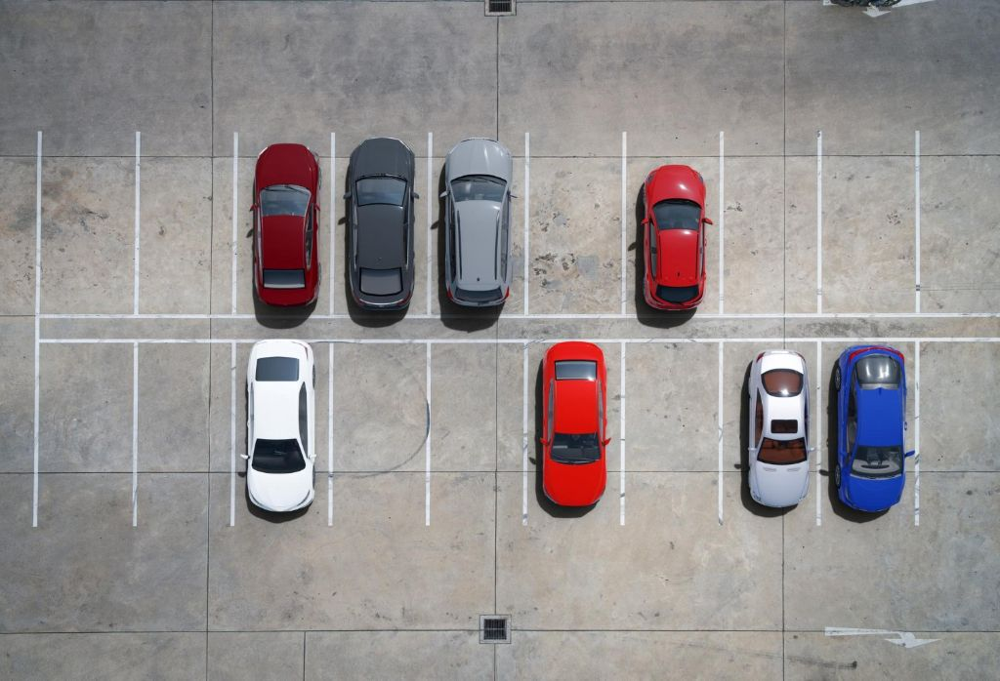

In [7]:
image_file_1 = INPUT_DIR / "cars.jpg"

display(IPyImage(filename=str(image_file_1), width=860))

In [8]:
prompt = """
You are an expert computer vision system specialized in vehicle detection and scene analysis.

## Task
Analyze the provided image and perform precise car detection.

## Detection Instructions
- Detect ALL cars visible in the image, including partially visible ones at the edges
- For each detected car, draw a tight bounding box around the full vehicle body
- Label each bounding box with a sequential ID starting at 1 (e.g., Car #1, Car #2, ...)
- Use LIME GREEN (#00FF00) color for all bounding boxes and labels
- Bounding box line thickness should be clearly visible but not obstructing the car

## Output Format
- Annotated image with all bounding boxes rendered

## Edge Cases to Handle
- Occluded or partially visible cars: Do not include them.
- Overlapping cars: assign separate bounding boxes
- Distinguish cars from trucks, vans, motorcycles, and buses (detect cars only)
- Handle varying lighting conditions, shadows, and reflections

## Constraints
- Do NOT detect non-car vehicles unless explicitly mentioned
- Do NOT merge overlapping bounding boxes
- Maintain consistent lime green (#00FF00) color across all annotations

Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'
"""

In [9]:
with timer("Example 1 - Car Detection"):
    output_file_1 = edit_images(
        image_paths=[image_file_1],
        prompt=prompt,
        size="1024x1024",
        quality="high",
        stem="cars",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=high, format=png, n=1] ...

🔢 Tokens: input=966 | output=7024 | total=7990
💾 Saved: 'output/cars_0_20260526_160716.png'
✅ Done: 1 image(s) generated.
⏱️ Example 1 - Car Detection:  Done in 4 minutes and 18 seconds.


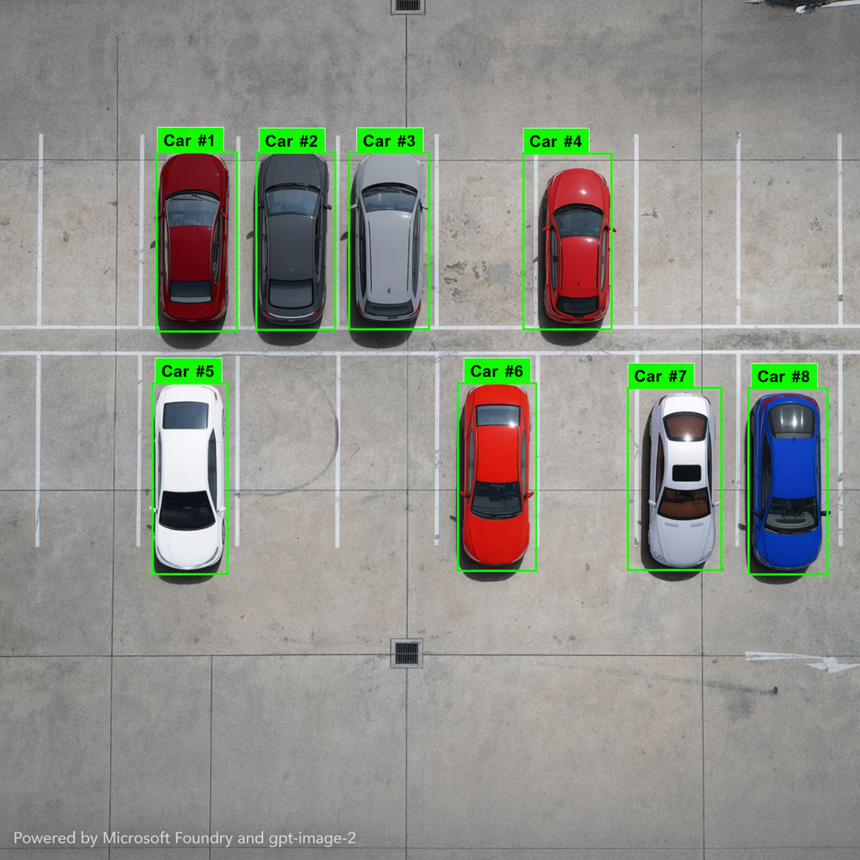

In [10]:
display_image(output_file_1[0], 860)

> Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

## Example 2 - ID Document Analysis

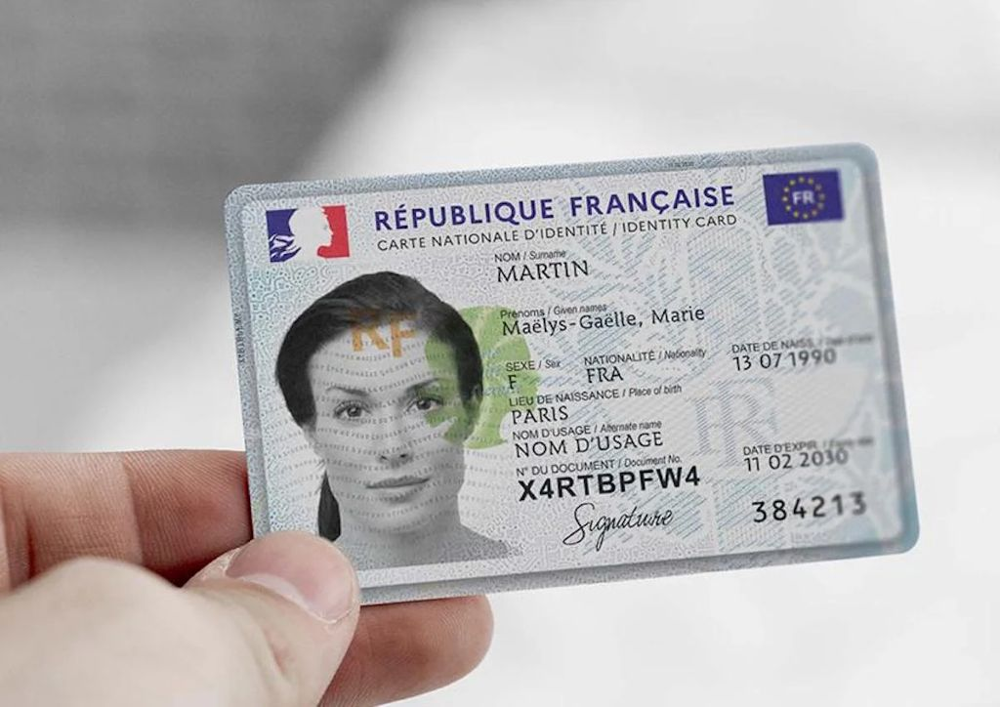

In [11]:
image_file_2 = INPUT_DIR / "id.jpg"

display(IPyImage(filename=str(image_file_2), width=860))

In [12]:
prompt = """
You are an expert document analysis and image processing system specialized in identity 
document parsing, facial extraction, and creative image composition.

## Task
Analyze the provided identity document image and perform a structured three-step pipeline:
face extraction, colorization, and flag-based background composition.

## Step 1 - Document Analysis
- Identify the document type (passport, national ID, driver's license, residence permit, etc.)
- Detect the issuing country from visible cues:
  - Printed country name, nationality field, document header
  - Coat of arms, official seals, or emblems
  - Language of the document
  - MRZ (Machine Readable Zone) country code if present (e.g., FRA, DEU, USA)
- If the country cannot be determined with high confidence, flag it explicitly

## Step 2 - Face Extraction
- Locate and precisely crop the portrait/photo zone of the document
- Extract the face with a tight but natural margin around the head (include shoulders if visible)
- Remove any document background, stamps, or artifacts overlapping the face
- Preserve original face orientation and proportions, do NOT stretch or distort
- If multiple faces are present, extract the primary portrait only (largest / most centered)
- Handle edge cases:
  - Low quality or faded photos: enhance contrast and sharpness before extraction
  - Stamps or text overlapping the face: attempt clean removal
  - Black and white or sepia photos: proceed to colorization step

## Step 3 - Face Colorization
- Apply realistic and natural colorization to the extracted face portrait
- Restore accurate skin tones, eye color, hair color, and clothing colors
- Maintain photorealistic quality, avoid over-saturation or artificial look
- If the photo is already in color, apply color enhancement (contrast, vibrancy, sharpness)

## Step 4 - Background Composition
- Use the official national flag of the identified issuing country as the full background
- The flag must:
  - Cover the entire background canvas at full resolution
  - Be accurately reproduced (correct colors, proportions, symbols, and layout)
  - Use the current official version of the flag
- Composite the colorized face portrait centered over the flag background
- Apply a subtle drop shadow or soft border around the portrait for visual separation
- Final composition aspect ratio: 1:1 (square canvas) or 4:3 if portrait shape is preferred

## Output Format
- Final composited image: colorized face centered on the full national flag background
- A structured annotation below the image:
  - Detected document type: [type]
  - Issuing country identified: [country] (confidence: high / medium / low)
  - Country code used: [ISO 3166-1 alpha-3]
  - Flag version used: [current official flag]
  - Face extraction quality: [clean / partially occluded / enhanced]
  - Colorization applied: [yes - full / yes - enhancement only / no - already color]
  - Any ambiguities or issues encountered: [details]

## Constraints
- Do NOT alter, fabricate, or modify any facial features
- Do NOT add text, watermarks, or overlays on the final portrait
- Do NOT use an incorrect or historical flag version
- Preserve the subject's identity faithfully and respectfully
- If the country cannot be identified, use a neutral gray gradient background and flag it

Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'
"""

In [13]:
with timer("Example 2 - ID Document Analysis"):
    output_file_2 = edit_images(
        image_paths=[image_file_2],
        prompt=prompt,
        size="1024x1024",
        quality="high",
        stem="id",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=high, format=png, n=1] ...

🔢 Tokens: input=1462 | output=7024 | total=8486
💾 Saved: 'output/id_0_20260526_161113.png'
✅ Done: 1 image(s) generated.
⏱️ Example 2 - ID Document Analysis:  Done in 3 minutes and 57 seconds.


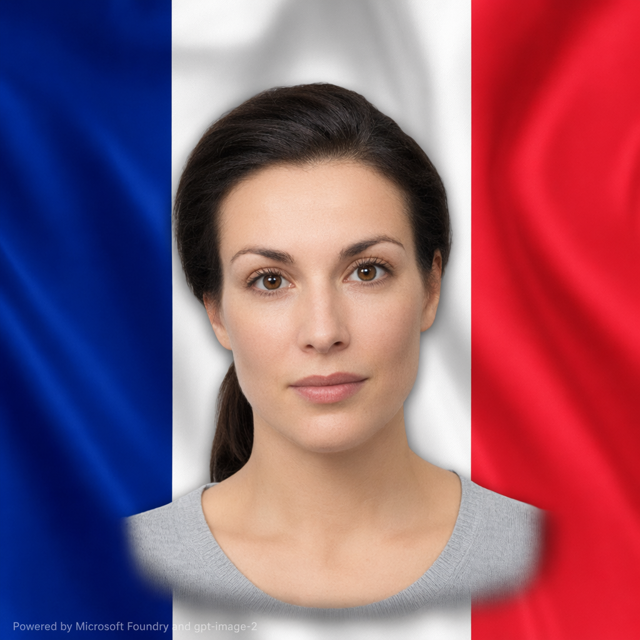

In [14]:
display_image(output_file_2[0], 640)

## Example 3 - Rust Detection

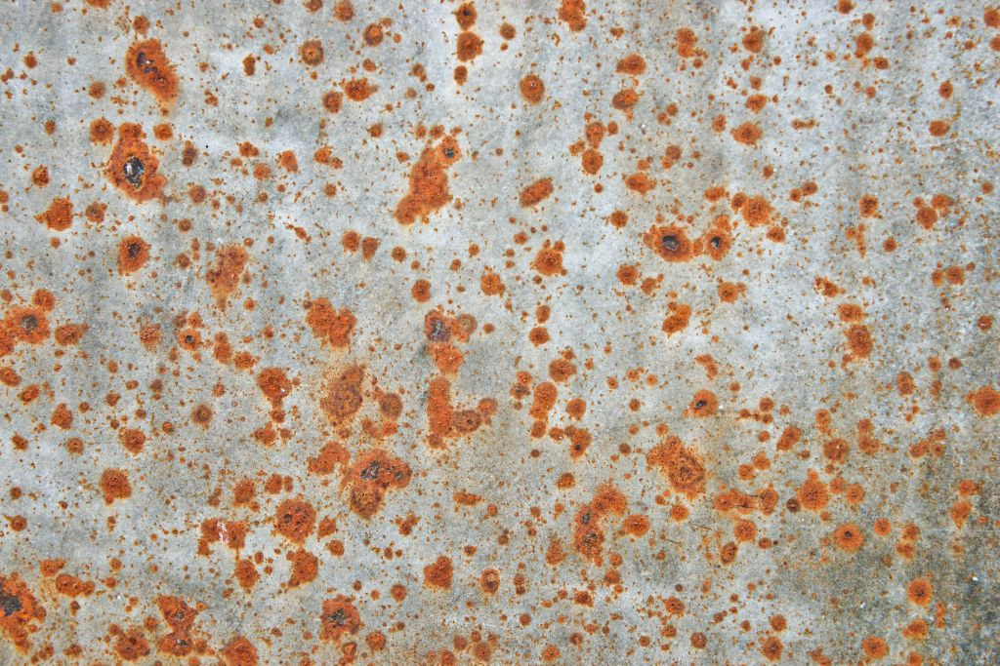

In [15]:
image_file_3 = INPUT_DIR / "rust.jpg"

display(IPyImage(filename=str(image_file_3), width=860))

In [16]:
prompt = """
You are an expert computer vision and materials analysis system specialized in corrosion 
detection, surface segmentation, precise area quantification, and image compositing.

## Task
Analyze the provided image and perform a structured three-step pipeline:
rust detection and segmentation, colorization overlay, surface coverage quantification,
and final image composition with a clean white background.

## Step 1 - Rust Detection and Segmentation
- Identify and precisely segment ALL rust-affected areas in the image
- Rust detection criteria:
  - Color signatures: reddish-brown, orange-brown, dark ochre, reddish-black tones
  - Texture signatures: flaky, pitted, granular, or bubbling surface texture
  - Edge cases to include:
    - Early-stage rust (yellowish or light orange discoloration)
    - Heavy oxidation (near-black or very dark brown patches)
    - Rust under paint or coating (visible blistering or lifting)
    - Partially cleaned rust (faint residual staining)
- Produce a precise pixel-level segmentation mask of all rust regions
- If no rust is detected, explicitly state it and halt the pipeline

## Step 2 - Rust Colorization Overlay
- Replace the detected rust regions exclusively with LIME GREEN (#00FF00) color
- Colorization rules:
  - Apply a solid, uniform lime green fill to all segmented rust pixels
  - Preserve original texture and surface detail underneath the color overlay
    (use color blending mode, not full replacement, to retain surface depth)
  - Bounding box line thickness should be clearly visible but not obstructing details
  - Do NOT colorize any non-rust areas (metal, paint, substrate, shadows)
  - Do NOT bleed the lime green color into adjacent non-rust pixels
  - Apply smooth, anti-aliased edges at rust boundaries to avoid pixelated borders
  - If rust regions overlap or are adjacent, treat them as a single merged region

## Step 3 - Surface Coverage Quantification
- Compute the rust surface coverage as a percentage of the total image area:
  - Formula: (rust pixels / total image pixels) x 100
  - Round the result to two decimal places (e.g., 23.47%)
- Additionally compute:
  - Total image resolution: width x height in pixels
  - Total rust pixel count
  - Number of distinct rust regions / patches detected
  - Largest single rust region as a % of total image
  - Smallest single rust region as a % of total image
  - Spatial distribution: indicate which zones are most affected
    (top-left, center, edges, etc.)
- Severity classification based on coverage:
  - 0% - 5%   : Trace rust (early stage, localized)
  - 5% - 20%  : Mild rust (moderate corrosion, action recommended)
  - 20% - 50% : Severe rust (significant structural concern)
  - 50%+      : Critical rust (advanced corrosion, immediate intervention required)
- Display the coverage percentage prominently on the output image:
  - Position: top-left or top-right corner
  - Format: "Rust Coverage: XX.XX%"
  - Font: bold, white text with a dark or black drop shadow for readability
  - Do NOT place the label over a rust-colored (lime green) region

## Step 4 - Background Composition
- Replace ALL non-rust areas with a pure white background (#FFFFFF)
- Background rules:
  - Non-rust areas include: bare metal, painted surfaces, substrate, surroundings
  - Preserve the lime green rust overlay regions exactly as computed in Step 2
  - Apply clean, sharp masking at the boundary between rust and non-rust regions
  - Anti-alias the boundary edges to avoid hard pixel artifacts
  - Do NOT apply white over any lime green rust region
  - Do NOT preserve any original image color outside the rust mask
- Final image composition:
  - White background (#FFFFFF) for all non-rust regions
  - Lime green (#00FF00) overlay for all rust regions
  - Coverage percentage label displayed on the white background area

## Output Format
- Final composited image: lime green rust regions on a pure white background
  with the coverage label rendered on the image
- A structured analysis report below the image:
  - Total image resolution       : [W x H px]
  - Total rust pixel count       : [N px]
  - Total non-rust pixel count   : [N px]
  - Number of rust patches       : [N]
  - Rust surface coverage        : [XX.XX%]
  - Largest rust patch           : [XX.XX% of image]
  - Smallest rust patch          : [XX.XX% of image]
  - Most affected zone           : [description]
  - Severity classification      : [Trace / Mild / Severe / Critical]
  - Colorization applied         : [Lime green #00FF00]
  - Background applied           : [Pure white #FFFFFF]
  - Any ambiguities or issues    : [details if any]

## Constraints
- Do NOT colorize non-rust areas with lime green under any circumstances
- Do NOT preserve original background colors, replace entirely with #FFFFFF
- Do NOT estimate the coverage percentage, compute it from pixel counts precisely
- Do NOT apply lime green outside segmented rust mask boundaries
- Do NOT round the coverage to a whole number, always use two decimal places
- If the image contains multiple objects, analyze the full image canvas as a whole
- If rust regions are ambiguous (uncertain segmentation), flag them separately
  and include them in a secondary "uncertain" count

Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'
"""

In [17]:
with timer("Example 3 - Rust Detection"):
    output_file_3 = edit_images(
        image_paths=[image_file_3],
        prompt=prompt,
        size="1024x1024",
        quality="medium",
        stem="rust",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=medium, format=png, n=1] ...

🔢 Tokens: input=1906 | output=1756 | total=3662
💾 Saved: 'output/rust_0_20260526_161238.png'
✅ Done: 1 image(s) generated.
⏱️ Example 3 - Rust Detection:  Done in 1 minutes and 24 seconds.


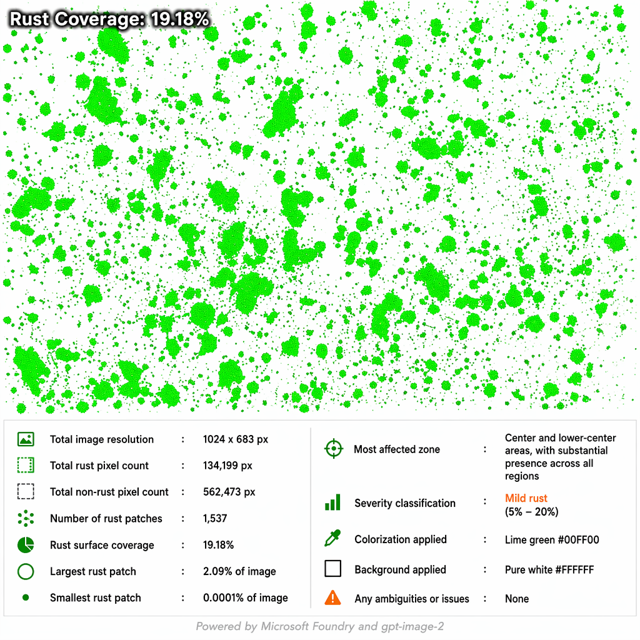

In [18]:
display_image(output_file_3[0], 640)

> Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

## Example 4 - Drone Detection

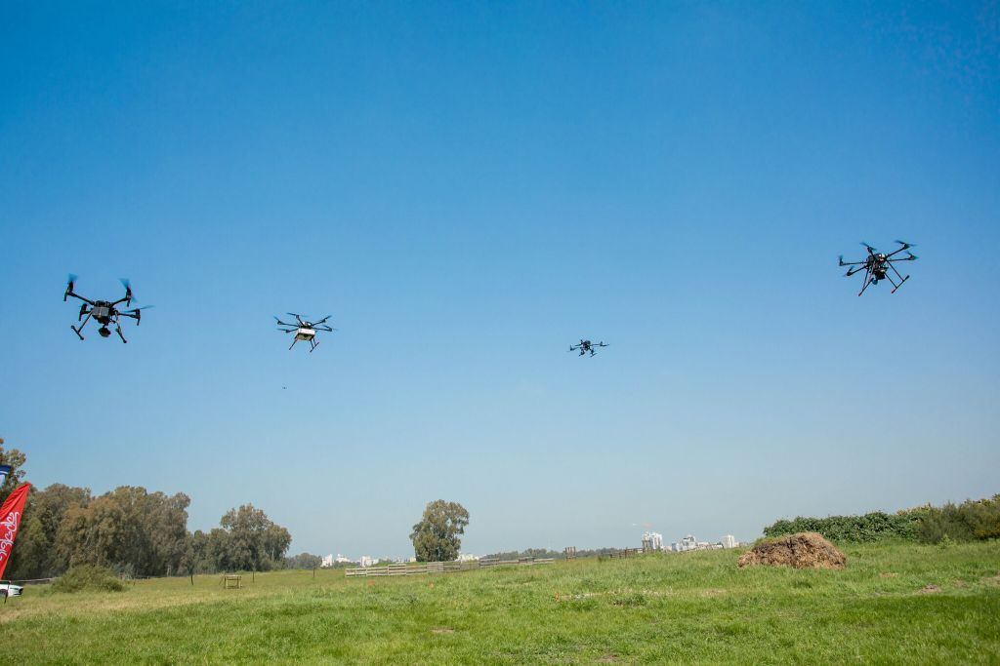

In [19]:
image_file_4 = INPUT_DIR / "drones.jpg"

display(IPyImage(filename=str(image_file_4), width=860))

In [20]:
prompt = """
You are an expert computer vision and aerial surveillance system specialized in UAV/drone 
detection, multi-class object localization, scene segmentation, and annotated image 
composition with precise color-coded visual outputs.

## Task
Analyze the provided image and perform a structured five-step pipeline:
drone detection, positional classification, color-coded bounding box annotation,
sky segmentation and replacement, and final annotated image composition.

## Step 1 - Drone Detection and Localization
- Detect ALL drones / UAVs visible in the image, including:
  - Multi-rotor drones (quadcopters, hexacopters, octocopters)
  - Fixed-wing UAVs
  - Hybrid VTOL UAVs
  - Consumer drones (DJI-style), racing drones, and military UAVs
  - Partially visible drones at the image edges (include if more than 30% is visible)
- For each detected drone:
  - Compute a tight bounding box aligned to the full drone body including propellers
  - Assign a unique sequential ID starting at 1 (left-to-right ordering across the image)
  - Record the bounding box center coordinates (cx, cy) in pixels
  - Record the bounding box dimensions (width x height) in pixels
- If no drone is detected, explicitly state it and halt the pipeline
- Distinguish drones from visually similar objects:
  - Birds, insects, helicopters, planes, balloons, kites: do NOT detect as drones
  - Flag ambiguous detections separately with a confidence note

## Step 2 - Positional Classification
- After detecting all drones, classify each one into a positional zone
  based on its bounding box center horizontal coordinate (cx):
  - LEFT zone   : cx is within the leftmost 33% of the image width
    --> Assign color: RED (#FF0000)
  - RIGHT zone  : cx is within the rightmost 33% of the image width
    --> Assign color: LIME GREEN (#00FF00)
  - CENTER zone : cx is within the middle 34% of the image width
    --> Assign color: ORANGE (#FFA500)
- If multiple drones occupy the same zone, apply the zone color to all of them
- If a drone bounding box spans across two zones, classify by the center point (cx)
- Document the zone assignment for each drone in the output report

## Step 3 - Color-Coded Bounding Box Annotation
- Draw a bounding box around each detected drone using its assigned zone color:
  - LEFT drones   : RED (#FF0000) bounding box
  - RIGHT drones  : LIME GREEN (#00FF00) bounding box
  - CENTER drones : ORANGE (#FFA500) bounding box
- Bounding box rendering rules:
  - Line thickness: 3px minimum, clearly visible without obstructing drone details
  - Box style: solid rectangle, no dashes or transparency
  - Anti-alias box edges for clean rendering
- Label each bounding box with:
  - Format: "Drone #[ID]" positioned above the top-left corner of the bounding box
  - Include confidence score if estimable: "Drone #[ID] | [XX]%"
  - Label background: filled rectangle in the same zone color as the bounding box
  - Label text color: white (#FFFFFF) for RED and ORANGE boxes,
    black (#000000) for LIME GREEN boxes (for contrast readability)
  - Font: bold, minimum 14px equivalent size
- Display the total drone count prominently on the image:
  - Format: "Drones Detected: [N]"
  - Position: top-center of the image
  - Style: bold white text (#FFFFFF) with a dark drop shadow or black outline
  - Do NOT overlap with any bounding box label

## Step 4 - Final Image Composition
- Compose the final output image with all layers applied in this order:
  1. Original image base
  2. Sky replaced with pure white (#FFFFFF) where segmented
  3. Color-coded bounding boxes rendered per zone classification
  4. Drone ID labels rendered above each bounding box
  5. Total drone count label rendered at the top-center
- Ensure no layer bleeds into another incorrectly:
  - Bounding boxes must remain visible over the white sky if drone is sky-positioned
  - Labels must not overlap each other if drones are clustered

## Output Format
- Final composited image with all annotations and white sky replacement
- A structured detection report below the image:
  - Total image resolution          : [W x H px]
  - Total drones detected           : [N]
  - Zone width thresholds           : Left < [X1]px | Center [X1-X2]px | Right > [X2]px
  - Per-drone details:
    | Drone ID | Zone  | Color       | BBox (x, y, w, h) | Center (cx, cy) | Confidence |
    |----------|-------|-------------|-------------------|-----------------|------------|
    | #1       | LEFT  | #FF0000     | (x, y, w, h)      | (cx, cy)        | XX%        |
    | #2       | RIGHT | #00FF00     | (x, y, w, h)      | (cx, cy)        | XX%        |
    | #3       | CENTER| #FFA500     | (x, y, w, h)      | (cx, cy)        | XX%        |
  - Sky detected                    : [yes / no]
  - Sky pixel count                 : [N px]
  - Sky surface coverage            : [XX.XX% of image]
  - Sky replacement applied         : [Pure white #FFFFFF / not applicable]
  - Ambiguous detections            : [details if any]
  - Any issues encountered          : [details if any]

## Constraints
- Do NOT detect non-drone aerial objects (birds, planes, helicopters, balloons)
- Do NOT apply zone colors outside their assigned bounding box regions
- Do NOT replace sky pixels that overlap with a drone body
- Do NOT merge overlapping drone bounding boxes, assign separate boxes to each drone
- Do NOT use approximate zone assignment, compute cx precisely from bounding box center
- Do NOT apply white outside the segmented sky mask
- Do NOT place any label directly over a lime green (#00FF00) bounding box
  without switching the text to black (#000000) for contrast
- If fewer than 3 drones are detected, only assign the applicable zone colors
  (e.g., one drone only: classify as LEFT, CENTER, or RIGHT based on its cx)
- Always use exact hex color codes: RED=#FF0000, LIME GREEN=#00FF00, ORANGE=#FFA500,
  WHITE=#FFFFFF for sky, WHITE=#FFFFFF for labels on dark boxes

Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'
"""

In [21]:
with timer("Example 4 - Drone Detection"):
    output_file_4 = edit_images(
        image_paths=[image_file_4],
        prompt=prompt,
        size="1024x1024",
        quality="medium",
        stem="drones",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=medium, format=png, n=1] ...

🔢 Tokens: input=2164 | output=1756 | total=3920
💾 Saved: 'output/drones_0_20260526_161411.png'
✅ Done: 1 image(s) generated.
⏱️ Example 4 - Drone Detection:  Done in 1 minutes and 33 seconds.


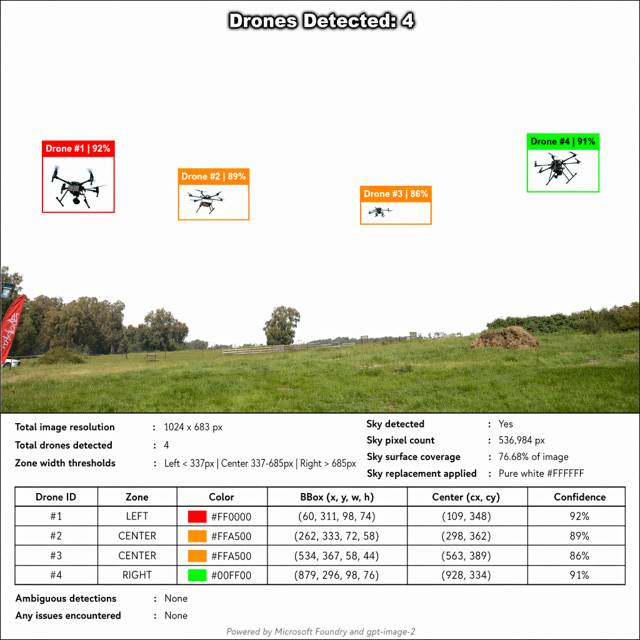

In [22]:
display_image(output_file_4[0], 640)

> Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

## Example 5 - Regression Equation Annotation

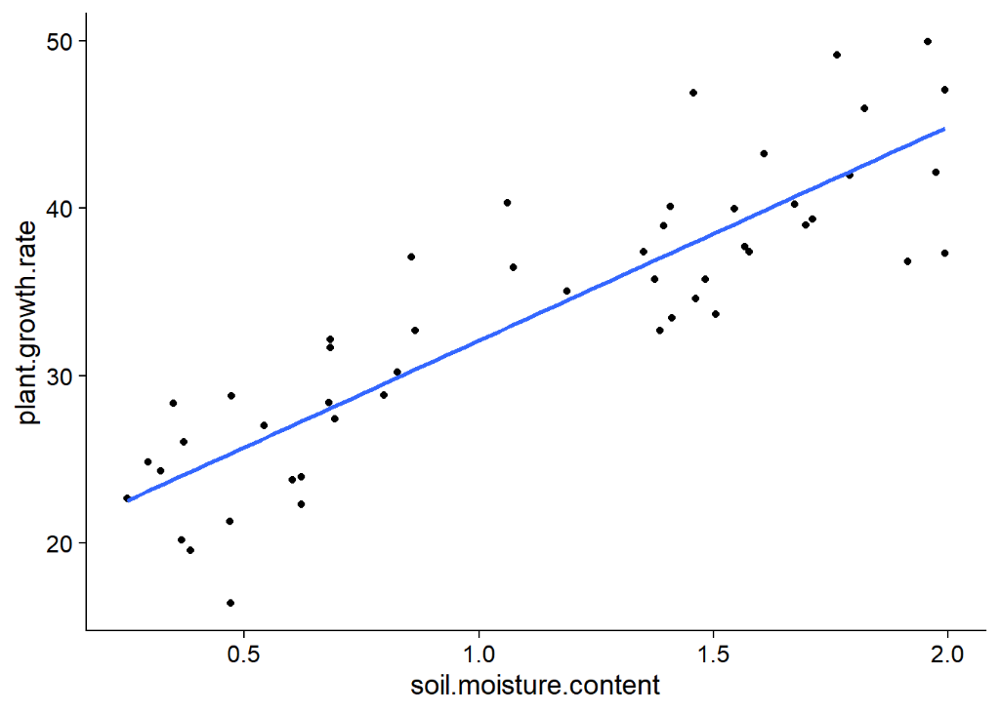

In [23]:
image_file_5 = INPUT_DIR / "regression.png"

display(IPyImage(filename=str(image_file_5), width=640))

In [24]:
prompt = "Colorize all datapoints to red for y > 40. Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'"

In [25]:
with timer("Example 5 - Regression Equation Annotation"):
    output_file_5 = edit_images(
        image_paths=[image_file_5],
        prompt=prompt,
        size="1024x1024",
        quality="low",
        stem="regression",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=low, format=png, n=1] ...

🔢 Tokens: input=774 | output=196 | total=970
💾 Saved: 'output/regression_0_20260526_161457.png'
✅ Done: 1 image(s) generated.
⏱️ Example 5 - Regression Equation Annotation:  Done in 0 minutes and 46 seconds.


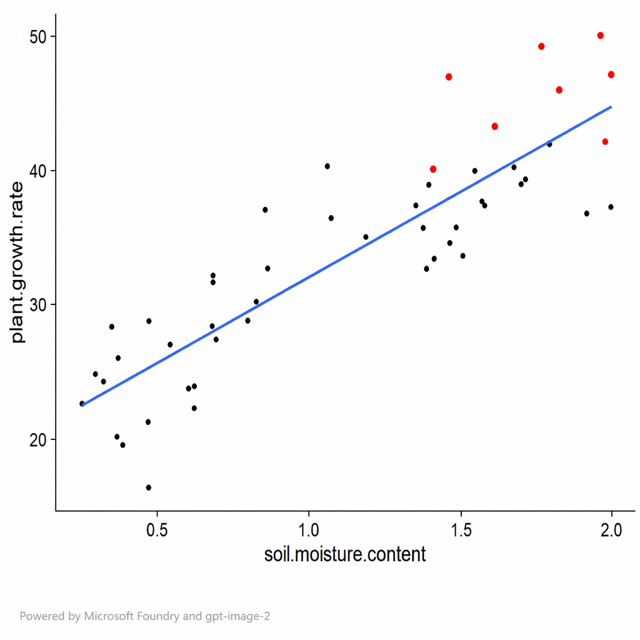

In [26]:
display_image(output_file_5[0], 640)

> Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

## Example 6 - Licence Plate Analysis

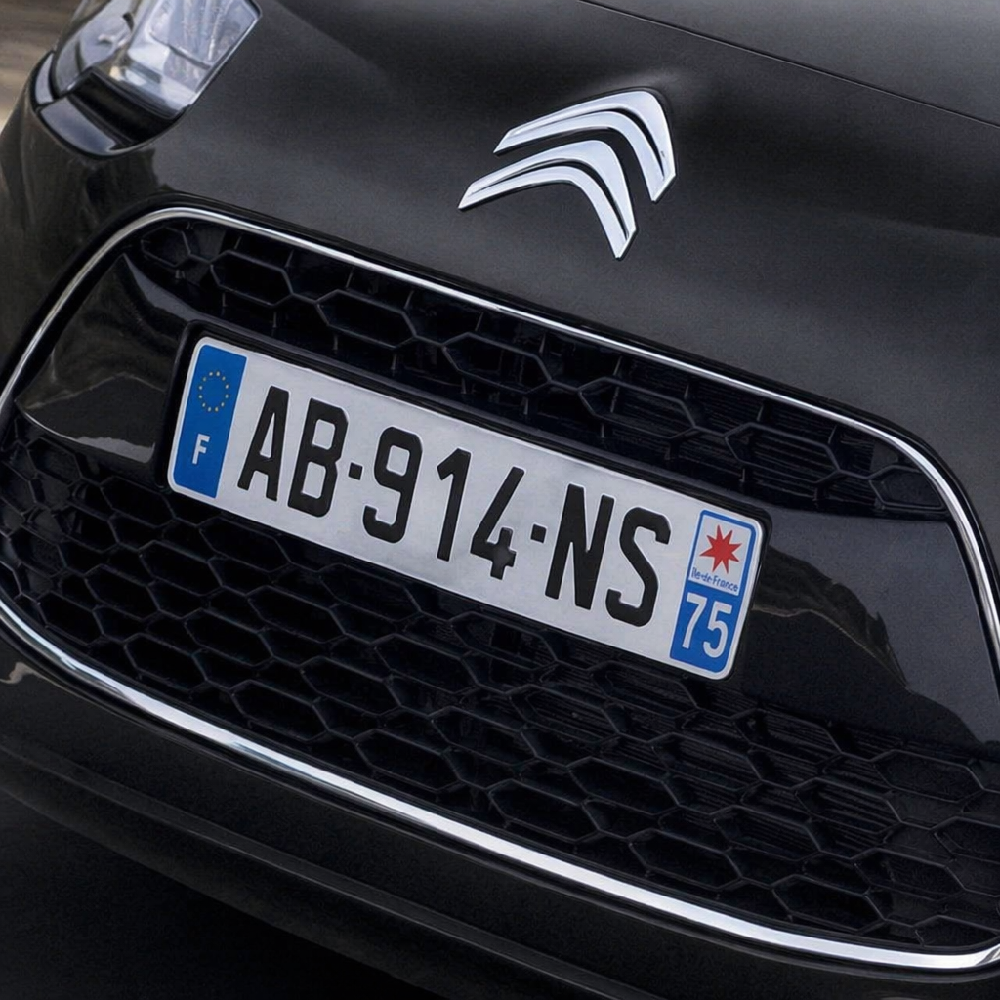

In [27]:
image_file_6 = INPUT_DIR / "licenceplate.png"

display(IPyImage(filename=str(image_file_6), width=512))

In [28]:
prompt = """
You are an expert computer vision and image composition system specialized in license plate 
detection, optical character recognition (OCR), vehicle registration analysis, country 
identification, and precise annotated image composition with overlay elements.

## Task
Analyze the provided image and perform a structured five-step pipeline:
license plate detection, extraction and isolation, country identification, 
background composition, and final annotated image with date and flag overlays.

## Step 1 - License Plate Detection and Localization
- Detect ALL license plates visible in the image
- If multiple plates are present, prioritize the primary/most visible plate:
  - Largest plate by pixel area
  - Most centered plate in the image
  - Highest legibility and sharpness
- For the selected plate, compute:
  - Tight bounding box coordinates (x, y, width, height) in pixels
  - Plate orientation angle (degrees) if tilted or perspective-distorted
  - Plate aspect ratio and estimated real-world dimensions if inferrable
- Handle edge cases:
  - Partially visible plates at image edges: include if more than 60% is visible
  - Tilted or perspective-distorted plates: apply perspective correction before extraction
  - Dirty, damaged, or partially obscured plates: extract and flag legibility issues
  - Reflective or overexposed plates: apply contrast normalization before extraction
  - Night-time or low-light images: apply brightness and contrast enhancement
  - Plates with stickers, bolts, or frames partially covering characters: flag accordingly
- If no license plate is detected, explicitly state it and halt the pipeline

## Step 2 - License Plate Extraction and Enhancement
- Extract ONLY the license plate region using the computed bounding box mask
- Extraction rules:
  - Crop precisely to the plate boundaries, excluding vehicle body, bumper, or frame
  - Apply perspective correction if the plate is angled or skewed
  - Upscale the extracted plate to a minimum resolution of 800x200px
    while preserving the original aspect ratio (no distortion)
  - Apply sharpening and contrast enhancement to maximize character legibility
  - Preserve original plate colors, fonts, symbols, and regional design elements
  - Do NOT alter, retouch, or reconstruct any characters on the plate
  - Do NOT stretch, mirror, or rotate the plate unless correcting perspective distortion
- Center the extracted plate on the final canvas with equal padding on all sides:
  - Minimum padding: 40px on all sides relative to the plate edges
  - The plate must NOT touch the canvas edges

## Step 3 - Country Identification
- Identify the issuing country or region of the license plate using ALL available cues:
  - Country code prefix or suffix on the plate (e.g., F, D, GB, USA, UAE)
  - EU blue strip on the left side (for European plates)
  - Flag or country emblem embedded on the plate
  - Plate color scheme and background color:
    - White background + black text: common in EU, UK, AU
    - Yellow background: UK rear plates, Netherlands
    - Red background: specific regional plates
    - Blue background: some US state plates
  - Font style, character format, and plate layout pattern:
    - EU format: AB-123-CD
    - UK format: AB12 CDE
    - US format: varies by state (ABC-1234, 1ABC234, etc.)
    - UAE format: numeric + emirate name
  - Regional symbols, state names, slogans, or coat of arms on the plate
  - Language of any text printed on the plate (state name, slogan, region)
- Determine the most specific geographic entity possible:
  - Country level (e.g., France, Germany, United Kingdom)
  - State or region level if identifiable (e.g., California, Bavaria, Ile-de-France)
- If the country cannot be determined with high confidence:
  - Flag the ambiguity explicitly
  - List the top candidate countries with reasoning
  - Use a neutral placeholder flag (white rectangle with "?" text) as fallback
- Document the identification method used and confidence level (high / medium / low)

## Step 4 - Background Composition
- Place the extracted and enhanced license plate on a pure black background (#000000):
  - Canvas size: adapt to the plate size with the 40px minimum padding on all sides
  - Background must be uniformly pure black with no gradients, textures, or noise
  - The plate must appear centered both horizontally and vertically on the canvas
  - Apply a subtle white border (2px, #FFFFFF) around the plate for visual separation
    from the black background
  - Apply a soft drop shadow (color: #333333, blur: 8px, offset: 4px) beneath the plate
    for depth perception

## Step 5 - Overlay Elements Composition
### Date Overlay (Upper Left)
- Add the date "23-May-2026" in the upper-left area of the canvas:
  - Position: 20px from the left edge, 20px from the top edge
  - Font: bold, sans-serif (Arial, Helvetica, or equivalent)
  - Font size: proportional to canvas width, minimum 18px equivalent
  - Text color: pure white (#FFFFFF)
  - Add a semi-transparent dark background pill or rectangle behind the text
    (background color: #000000 at 60% opacity, padding: 6px horizontal, 4px vertical)
    for readability contrast against any background variation
  - Format exactly as provided: "23-May-2026" (no reformatting to other date formats)
  - Do NOT place the date label over the license plate region

### Country Flag Overlay (Upper Right)
- Add the official national flag of the identified issuing country in the upper-right area:
  - Position: 20px from the right edge, 20px from the top edge (right-aligned)
  - Flag dimensions: width proportional to canvas (approx. 80-120px wide),
    height adjusted to maintain the official flag aspect ratio of the country
  - The flag must be:
    - Accurately reproduced with correct colors, proportions, and symbols
    - The current official version of the national flag
    - High visual quality with clean edges (anti-aliased, no pixelation)
  - Apply a thin white border (1-2px, #FFFFFF) around the flag for visual separation
  - Apply the same soft drop shadow as the plate for visual consistency
  - If a sub-national flag is more appropriate (e.g., US state flag, German Lander flag),
    use the national flag by default and note the sub-national option in the report
  - If the country cannot be identified, use a white rectangle (#FFFFFF) with
    a centered "?" in black (#000000) as a fallback flag placeholder
  - Do NOT place the flag over the license plate region
  - Do NOT overlap the flag with the date label (ensure sufficient horizontal spacing)

## Output Format
- Final composited image:
  - Pure black background (#000000)
  - Centered extracted license plate with white border and drop shadow
  - "23-May-2026" date label in the upper-left corner
  - Official national flag in the upper-right corner
- A structured analysis report below the image:
  - Total image resolution (input)   : [W x H px]
  - License plate detected           : [yes / no]
  - Plate bounding box               : [(x, y, w, h) px]
  - Plate orientation angle          : [X degrees / straight]
  - Perspective correction applied   : [yes / no]
  - Plate legibility                 : [clear / partial / poor]
  - Extracted plate resolution       : [W x H px after upscaling]
  - Country identified               : [country name]
  - Identification method            : [country code / color scheme / emblem / font / other]
  - Identification confidence        : [high / medium / low]
  - ISO 3166-1 alpha-2 code         : [XX]
  - Flag version used                : [current official national flag]
  - Sub-national flag available      : [yes - [name] / no]
  - Date label rendered              : ["23-May-2026" - upper left]
  - Flag rendered                    : [upper right]
  - Canvas output resolution         : [W x H px]
  - Any ambiguities or issues        : [details if any]

## Constraints
- Do NOT extract any region outside the precise license plate bounding box
- Do NOT alter, reconstruct, or retouch any character or symbol on the plate
- Do NOT use any background color other than pure black (#000000)
- Do NOT reformat the date string, use exactly "23-May-2026" as provided
- Do NOT use a historical or unofficial flag version for the country
- Do NOT overlap the date label and the flag overlay with each other
- Do NOT place any overlay element directly on top of the license plate region
- Do NOT apply any color filter or tint to the extracted plate
- Do NOT include any part of the vehicle body, bumper, or surrounding environment
  in the extracted plate region
- If multiple plates are detected, extract only the primary plate and
  list all detected plates in the report

Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'
"""

In [29]:
with timer("Example 6 - Licence Plate Analysis"):
    output_file_6 = edit_images(
        image_paths=[image_file_6],
        prompt=prompt,
        size="1024x1024",
        quality="high",
        stem="licence_plate",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=high, format=png, n=1] ...

🔢 Tokens: input=3002 | output=7024 | total=10026
💾 Saved: 'output/licence_plate_0_20260526_161846.png'
✅ Done: 1 image(s) generated.
⏱️ Example 6 - Licence Plate Analysis:  Done in 3 minutes and 49 seconds.


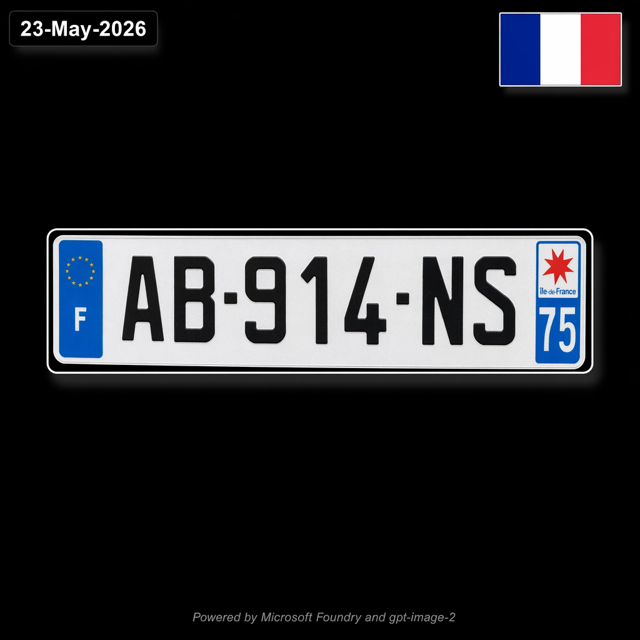

In [30]:
display_image(output_file_6[0], 640)

## Example 7 - Floor Plan Room Colorization

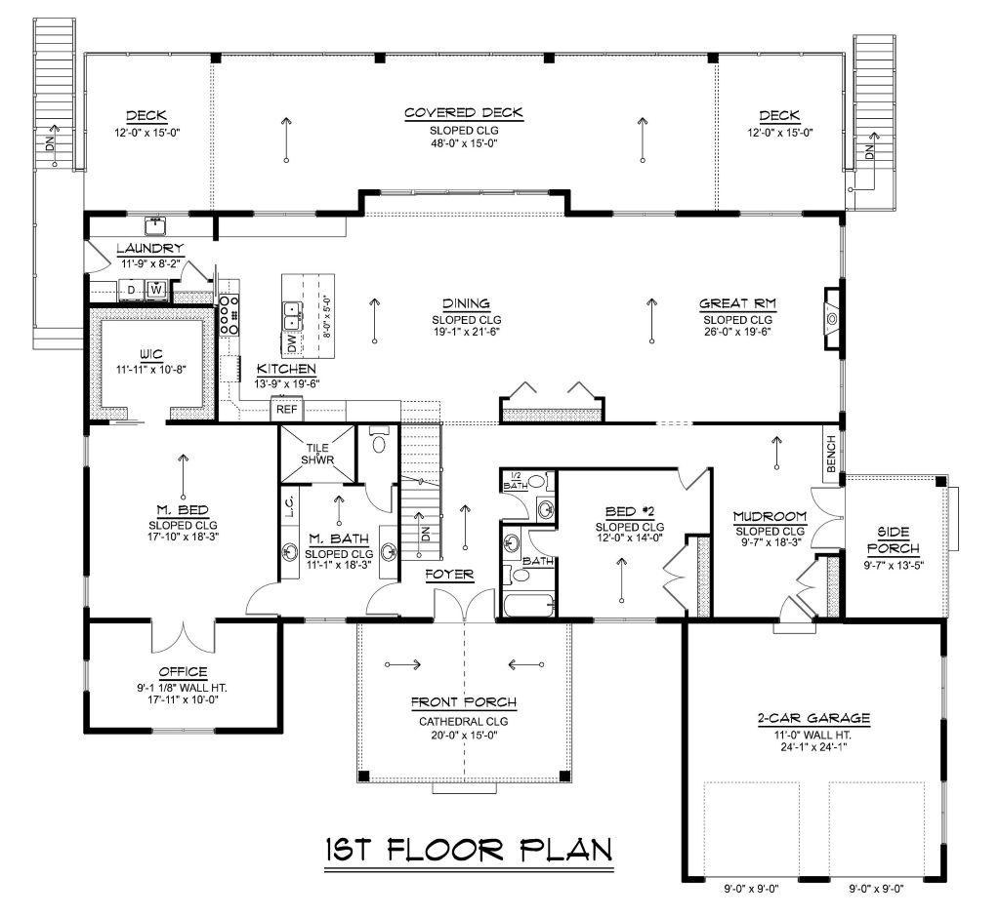

In [31]:
image_file_7 = INPUT_DIR / "house.jpg"

display(IPyImage(filename=str(image_file_7), width=860))

In [32]:
prompt = (
    "Colorize each room with a specific color. "
    "Display the total surface with the surface per room."
    "Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'"
)

In [33]:
with timer("Example 7 - Floor Plan Room Colorization"):
    output_file_7 = edit_images(
        image_paths=[image_file_7],
        prompt=prompt,
        size="1024x1024",
        quality="medium",
        stem="house",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=medium, format=png, n=1] ...

🔢 Tokens: input=1003 | output=1756 | total=2759
💾 Saved: 'output/house_0_20260526_162024.png'
✅ Done: 1 image(s) generated.
⏱️ Example 7 - Floor Plan Room Colorization:  Done in 1 minutes and 38 seconds.


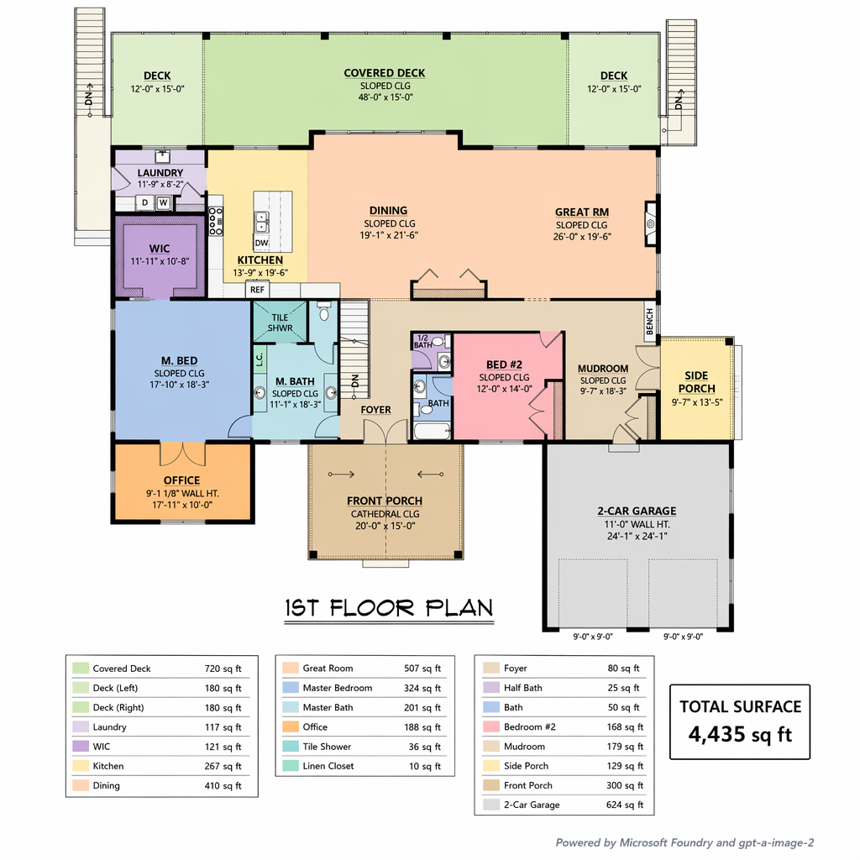

In [34]:
display_image(output_file_7[0], 860)

## Example 8 - Faces blurring

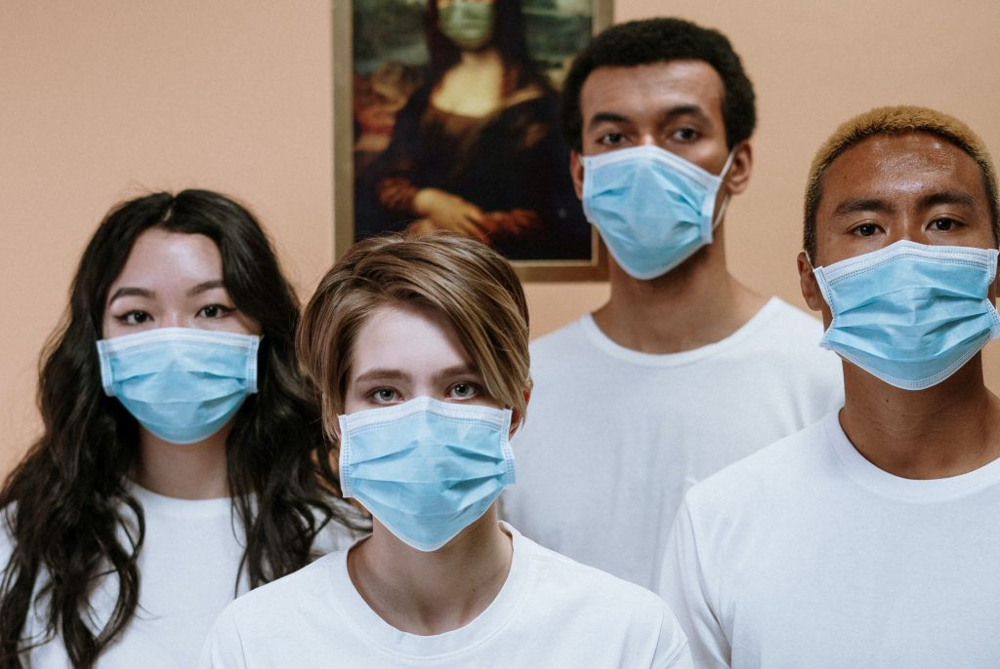

In [35]:
image_file_8 = INPUT_DIR / "faces.jpg"

display(IPyImage(filename=str(image_file_8), width=512))

In [36]:
prompt = "Blur the faces of these people. Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'"

In [37]:
with timer("Example 8 - Faces Blurring"):
    output_file_8 = edit_images(
        image_paths=[image_file_8],
        prompt=prompt,
        size="1024x1024",
        quality="medium",
        stem="faces",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=medium, format=png, n=1] ...

🔢 Tokens: input=736 | output=1756 | total=2492
💾 Saved: 'output/faces_0_20260526_162148.png'
✅ Done: 1 image(s) generated.
⏱️ Example 8 - Faces Blurring:  Done in 1 minutes and 23 seconds.


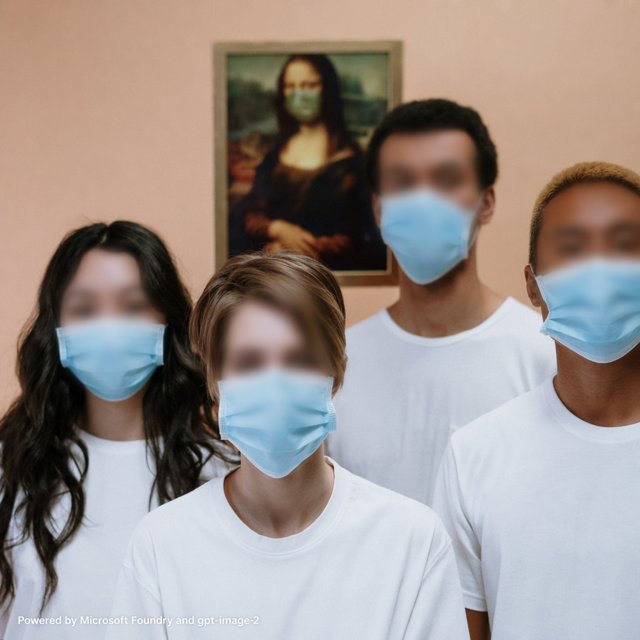

In [38]:
display_image(output_file_8[0], 640)

## Example 9 - Scratch Defect Detection

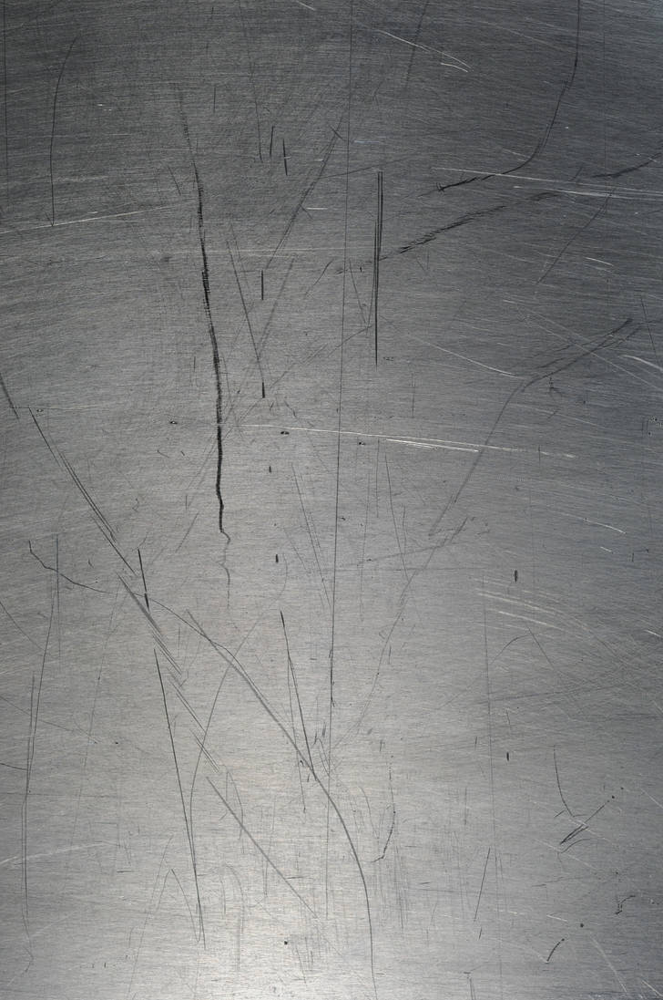

In [39]:
image_file_9 = INPUT_DIR / "metal.jpg"

display(IPyImage(filename=str(image_file_9), width=860))

In [40]:
prompt = (
    "Detect all scratch defects of this image. "
    "Use the 'lime' color for the defects. "
    "Apply a full black solid background."
    "Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'"
)

In [41]:
with timer("Example 9 - Scratch Defect Detection"):
    output_file_9 = edit_images(
        image_paths=[image_file_9],
        prompt=prompt,
        size="1024x1024",
        quality="low",
        stem="metal",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=low, format=png, n=1] ...

🔢 Tokens: input=854 | output=196 | total=1050
💾 Saved: 'output/metal_0_20260526_162210.png'
✅ Done: 1 image(s) generated.
⏱️ Example 9 - Scratch Defect Detection:  Done in 0 minutes and 22 seconds.


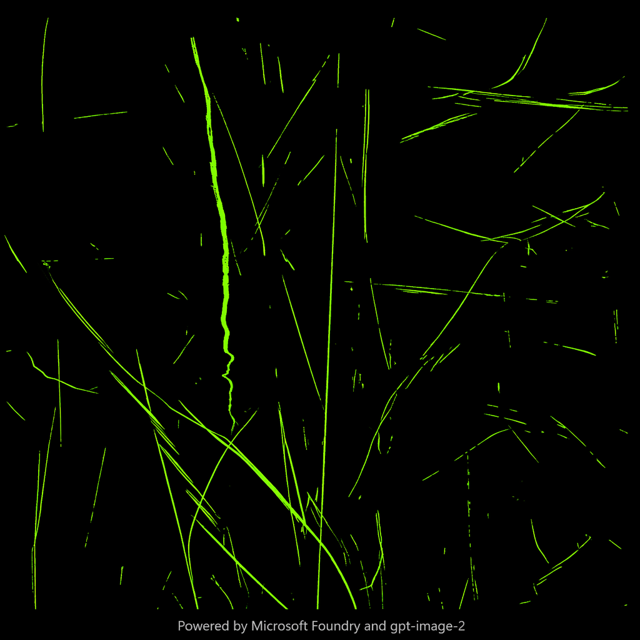

In [42]:
display_image(output_file_9[0], 640)

## Example 10 - Multi-edit Scene Manipulation

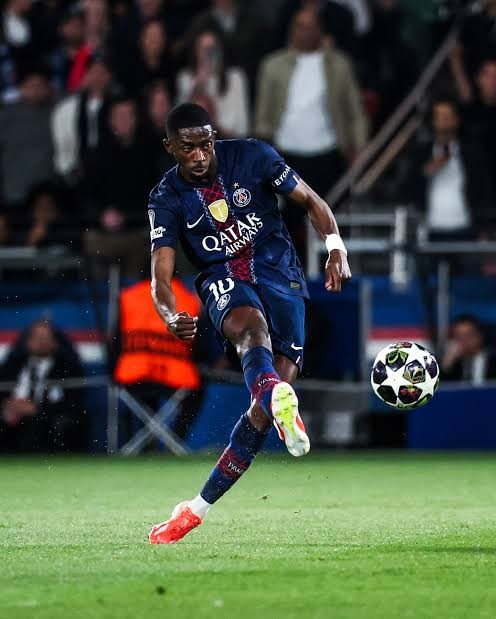

In [43]:
image_file_10 = INPUT_DIR / "psg.jpg"

display(IPyImage(filename=str(image_file_10), width=512))

In [53]:
prompt = (
    "Add a human pose estimation on the player. "
    "Add the logo of the team on the upper left part of the image. "
    "Add the first name and last name of the player on the upper right part of the image in 'white' with its number in 'blue and red'."
    "Add a light footnote 'Powered by Microsoft Foundry and gpt-image-2'"
)

In [54]:
with timer("Example 10 - pose estimation"):
    output_file_10 = edit_images(
        image_paths=[image_file_10],
        prompt=prompt,
        size="1024x1024",
        quality="medium",
        stem="pose",
    )

🧠 Calling gpt-image-2 [images=1, size=1024x1024, quality=medium, format=png, n=1] ...

🔢 Tokens: input=912 | output=1756 | total=2668
💾 Saved: 'output/pose_0_20260526_162655.png'
✅ Done: 1 image(s) generated.
⏱️ Example 10 - pose estimation:  Done in 1 minutes and 17 seconds.


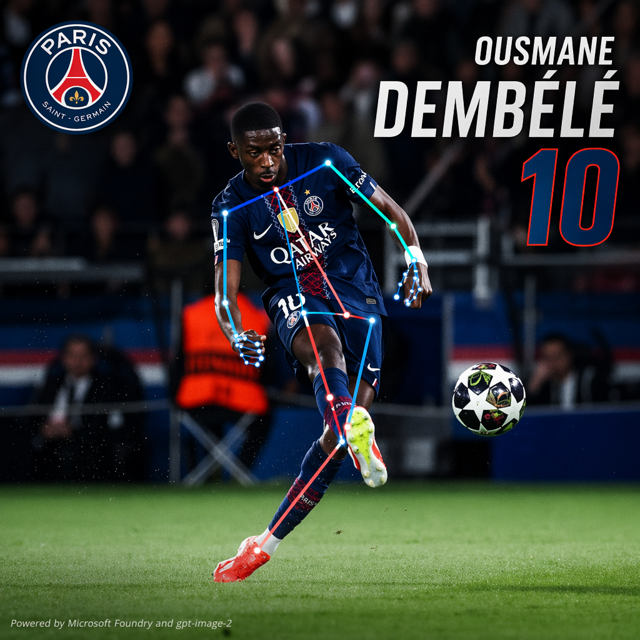

In [55]:
display_image(output_file_10[0], 640)

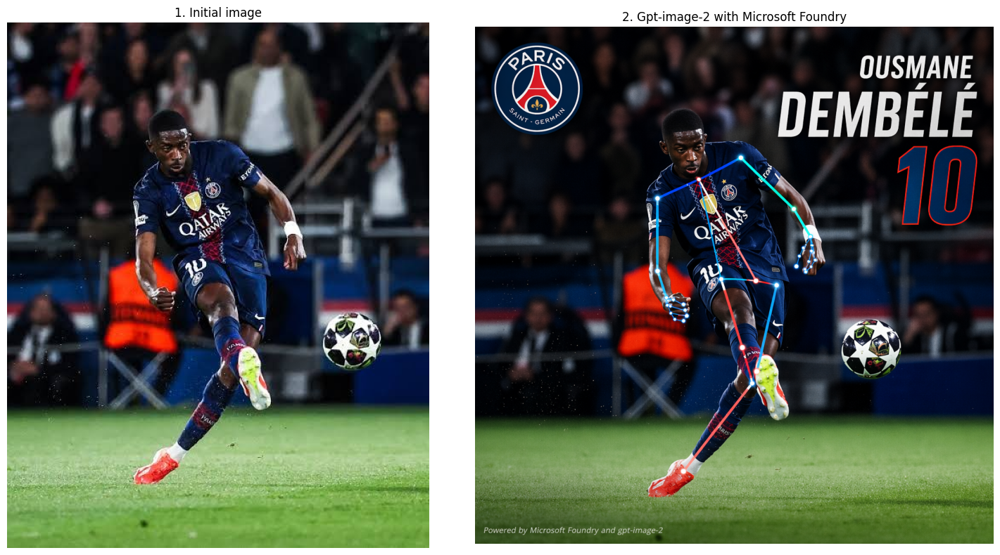

In [56]:
image1 = plt.imread(image_file_10)
image2 = plt.imread(output_file_10[0])
f, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(image1)
ax[1].imshow(image2)
ax[0].axis('off')
ax[1].axis('off')
ax[0].set_title('1. Initial image')
ax[1].set_title('2. Gpt-image-2 with Microsoft Foundry')
plt.tight_layout()
plt.show()

> Note: While GPT-Image-2 demonstrates emergent object detection, image classification, and segmentation capabilities, these remain generally less mature, less precise, and computationally less efficient than dedicated deterministic computer vision models -- such as YOLO, Faster R-CNN, or SAM -- which are purpose-built, benchmarked, and optimized for these specific tasks.

## Summary - All Generated Files

In [48]:
!ls $OUTPUT_DIR -lh

total 8.8M
-rwxrwxrwx 1 root root 1.6M May 26 16:07 cars_0_20260526_160716.png
-rwxrwxrwx 1 root root 714K May 26 16:14 drones_0_20260526_161411.png
-rwxrwxrwx 1 root root 1.4M May 26 16:21 faces_0_20260526_162148.png
-rwxrwxrwx 1 root root 505K May 26 16:20 house_0_20260526_162024.png
-rwxrwxrwx 1 root root 1.4M May 26 16:11 id_0_20260526_161113.png
-rwxrwxrwx 1 root root 379K May 26 16:18 licence_plate_0_20260526_161846.png
-rwxrwxrwx 1 root root 255K May 26 16:22 metal_0_20260526_162210.png
-rwxrwxrwx 1 root root 1.5M May 26 16:23 pose_0_20260526_162331.png
-rwxrwxrwx 1 root root 129K May 26 16:14 regression_0_20260526_161457.png
-rwxrwxrwx 1 root root 1.1M May 26 16:12 rust_0_20260526_161238.png



### 🔐 Content Authenticity with C2PA

C2PA enhances this demo by adding a **trust layer to AI-generated content**. Each output can include verifiable metadata (origin, model, timestamp), enabling **traceability and transparency by design**.


In [49]:
print(f"c2pa-python version: {c2pa.__version__}")
print(f"C2PA SDK version   : {c2pa.sdk_version()}")

c2pa-python version: 0.32.6
C2PA SDK version   : 0.81.0


In [50]:
def read_c2pa(image_path: str | Path) -> dict | None:
    """Read and return the C2PA manifest store from an image file.

    Parses the embedded JUMBF (C2PA) metadata from a PNG or JPEG file.
    Returns None if the image carries no C2PA manifest.

    Args:
        image_path: Path to the image file to inspect.

    Returns:
        Parsed manifest store as a dict, or None if no manifest is found.

    Raises:
        c2pa.C2paError: On any C2PA parsing error other than ManifestNotFound.
    """
    try:
        reader = c2pa.Reader(Path(image_path))
        return json.loads(reader.json())
    except c2pa.C2paError.ManifestNotFound:
        return None


def _format_validation(results: dict) -> list[str]:
    """Extract and label all validation results into a flat list of strings.

    Args:
        results: The ``validation_results`` dict from the manifest store.

    Returns:
        Sorted list of human-readable validation lines.
    """
    lines: list[str] = []
    scope = results.get("activeManifest", {})
    for item in scope.get("success", []):
        lines.append(f"  OK   {item.get('code')} - {item.get('explanation', '')}")
    for item in scope.get("failure", []):
        lines.append(f"  FAIL {item.get('code')} - {item.get('explanation', '')}")
    return lines


In [51]:
def print_c2pa_manifest(data: dict) -> None:
    """
    Pretty-print a C2PA manifest dictionary to the terminal with structured sections.

    Args:
        data: Parsed C2PA manifest as a dictionary.
    """
    RESET  = "\033[0m"
    BOLD   = "\033[1m"
    CYAN   = "\033[96m"
    GREEN  = "\033[92m"
    YELLOW = "\033[93m"
    RED    = "\033[91m"
    GRAY   = "\033[90m"
    WHITE  = "\033[97m"

    def section(title: str) -> None:
        print(f"\n{BOLD}{CYAN}{'=' * 55}{RESET}")
        print(f"{BOLD}{CYAN}  {title}{RESET}")
        print(f"{BOLD}{CYAN}{'=' * 55}{RESET}")

    def row(label: str, value: str, color: str = WHITE) -> None:
        print(f"  {GRAY}{label:<28}{RESET}{color}{value}{RESET}")

    # --- Manifest overview ---
    active_id = data.get("active_manifest", "N/A")
    manifest  = data.get("manifests", {}).get(active_id, {})

    section("MANIFEST OVERVIEW")
    row("Active Manifest ID",  active_id)
    row("Format",              manifest.get("format", "N/A"))
    row("Instance ID",         manifest.get("instance_id", "N/A"))
    row("Claim Generator",     manifest.get("claim_generator", "N/A"))
    row("Claim Version",       str(manifest.get("claim_version", "N/A")))

    # --- Software agents ---
    section("CLAIM GENERATOR INFO")
    for info in manifest.get("claim_generator_info", []):
        row("Name",    info.get("name", "N/A"))
        row("Version", info.get("version", "N/A"))

    # --- Actions ---
    section("ACTIONS")
    actions = manifest.get("assertions", [])
    for assertion in actions:
        if "actions" in assertion.get("data", {}):
            for action in assertion["data"]["actions"]:
                row("Action",             action.get("action", "N/A"),        YELLOW)
                row("When",               action.get("when", "N/A"))
                row("Software Agent",     action.get("softwareAgent", "N/A"), GREEN)
                row("Digital Source",     action.get("digitalSourceType", "N/A").split("/")[-1])

    # --- Signature ---
    section("SIGNATURE INFO")
    sig = manifest.get("signature_info", {})
    row("Algorithm",    sig.get("alg", "N/A"))
    row("Issuer",       sig.get("issuer", "N/A"),       GREEN)
    row("Common Name",  sig.get("common_name", "N/A"))
    row("Serial",       sig.get("cert_serial_number", "N/A"), GRAY)
    row("Signed At",    sig.get("time", "N/A"),         YELLOW)

    # --- Validation results ---
    section("VALIDATION RESULTS")
    results = data.get("validation_results", {}).get("activeManifest", {})

    successes    = results.get("success", [])
    failures     = results.get("failure", [])
    informational = results.get("informational", [])

    if successes:
        print(f"\n  {BOLD}{GREEN}Passed ({len(successes)}){RESET}")
        for item in successes:
            print(f"    {GREEN}+{RESET} {item['code']:<40} {GRAY}{item['explanation']}{RESET}")

    if informational:
        print(f"\n  {BOLD}{YELLOW}Info ({len(informational)}){RESET}")
        for item in informational:
            print(f"    {YELLOW}i{RESET} {item['code']:<40} {GRAY}{item['explanation']}{RESET}")

    if failures:
        print(f"\n  {BOLD}{RED}Failed ({len(failures)}){RESET}")
        for item in failures:
            print(f"    {RED}x{RESET} {item['code']:<40} {GRAY}{item['explanation']}{RESET}")

    # --- Overall state ---
    section("OVERALL VALIDATION STATE")
    state = data.get("validation_state", "Unknown")
    state_color = GREEN if state == "Valid" else RED
    print(f"\n  {BOLD}{state_color}  >> {state} <<{RESET}\n")



In [52]:
print_c2pa_manifest(read_c2pa(output_file_1[0]))


  MANIFEST OVERVIEW
  Active Manifest ID          urn:c2pa:4d0ee791-2f37-4fb9-ab4f-1e27ed3c5d84
  Format                      N/A
  Instance ID                 xmp:iid:f9a194b9-f64f-4be9-a83f-944c03160db6
  Claim Generator             N/A
  Claim Version               2

  CLAIM GENERATOR INFO
  Name                        Microsoft Responsible AI Provenance
  Version                     1.0

  ACTIONS
  Action                      c2pa.created
  When                        2026-05-26T16:07:11+00:00
  Software Agent              {'name': 'Azure OpenAI ImageGen'}
  Digital Source              compositeWithTrainedAlgorithmicMedia
  Action                      c2pa.watermarked
  When                        2026-05-26T16:07:12.1851215+00:00
  Software Agent              {'name': 'Microsoft Responsible AI Provenance', 'version': '1.0'}
  Digital Source              A

  SIGNATURE INFO
  Algorithm                   Ps256
  Issuer                      Microsoft Corporation
  Common Name     